<center>
<img src="./pict/librosa_logo.png">
<br />
<br />

# Introduction to audio processing 

In [1]:
import numpy as np
import scipy
from scipy.io import wavfile

import librosa # !pip install librosa

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import IPython.display as ipd

ipd.Audio('./data/wwry.wav')

### Дискретное представление аудио 

<center>
<img src="./pict/sound_wave_array.png">
<br />
<br />

In [3]:
samplerate, wavedata = wavfile.read('./data/wwry.wav')

In [4]:
wavedata # значение амплитуды волны

array([[    0,     0],
       [    0,     0],
       [    0,     0],
       ...,
       [-2151, -3924],
       [-2520, -3616],
       [-2712, -2999]], dtype=int16)

In [5]:
samplerate # стандартная частота дискретизации - 44100 Hz, сколько сэмплов в секунде

44100

In [6]:
type(wavedata) # знакомый нам numpy - массив

numpy.ndarray

In [7]:
wavedata.shape # 2 размерности (каналы) - стерео звук

(1543500, 2)

In [8]:
wavedata.shape[0] # количество сэмплов

1543500

In [9]:
int(wavedata.shape[0] / samplerate) # время записи в секундах, 35 секунд

35

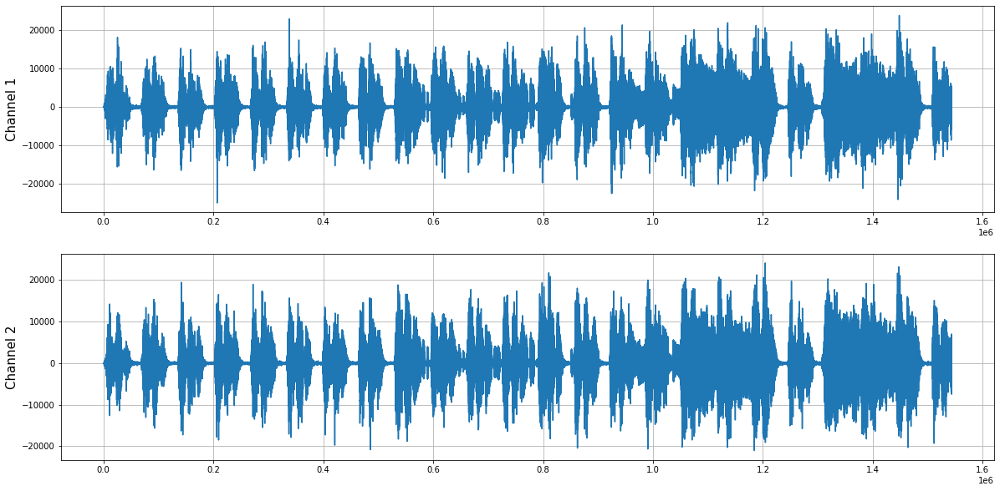

In [10]:
# waveform график 

plt.figure(figsize=(20, 10))
plt.subplot(2, 1, 1)
plt.plot(wavedata[:, 0])
plt.ylabel('Channel 1', fontsize=15)
plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(wavedata[:, 1])
plt.grid(True)
plt.ylabel('Channel 2', fontsize=15)
plt.show()

In [11]:
wavedata_mono = wavedata.mean(axis=1) / 32768.0 # стандартная нормализация
ipd.Audio(wavedata_mono[::-1], rate=samplerate) # можем развернуть или взять какой то сегмент

In [12]:
np.min(wavedata_mono), np.max(wavedata_mono)

(-0.5869598388671875, 0.58636474609375)

In [13]:
# Создание своих wav файлов 

sr = 22050 # частота дискретизации
T = 5.0    # секунды
t = np.linspace(0, T, int(T * sr), endpoint=False) # переменная времени
x = 0.5 * np.sin(2 * np.pi * 220 * t) # чистая синусоидная волна при 220 Гц

ipd.Audio(x, rate=sr)

# сохранение аудио
# librosa.output.write_wav('tone_220.wav', x, sr)

In [14]:
# считывание данных через Librosa

wavedata_librosa, samplerate = librosa.load('./data/wwry.wav', sr=samplerate, mono=True)

In [15]:
wavedata_librosa # моно звук с нормировкой

array([ 0.        ,  0.        ,  0.        , ..., -0.09269714,
       -0.09362793, -0.08714294], dtype=float32)

In [16]:
librosa.get_duration(wavedata_librosa, samplerate) # время записи в секундах

35.0

__Темп__: скорость, с которой паттерны повторяются. Темп измеряется в битах в минуту (BPM). Если у музыки 120 BPM, это значит, что каждую минуту в ней 120 битов (ударов).

__Бит__: отрезок времени. Это ритм, выстукиваемый в песне. Так, в одном такте 4 бита, например.

__Такт__: логичное деление битов. Обычно в такте 3 или 4 бита, хотя возможны и другие варианты.

__Интервал__: в программах для редактирования чаще всего встречаются интервалы. Обычно есть последовательность нот, например, 8 шестнадцатых одинаковой длины. Обычно интервал — 8 нот, триплеты или четверные.

__Ритм__: список музыкальных звуков. Все ноты и являются ритмом.

In [17]:
# https://librosa.org/doc/main/generated/librosa.util.frame.html

tempo, beat_frames = librosa.beat.beat_track(y=wavedata_librosa, sr=samplerate)
print(tempo)
print(librosa.frames_to_samples(beat_frames))

80.74951171875
[   8192   39424   72192  104960  137728  170496  203776  237056  268800
  303104  335360  368128  400384  432640  465408  498176  531456  563712
  597504  630272  663040  695296  727552  759808  793088  825344  858624
  889856  922112  952832  987648 1018880 1051648 1084416 1117696 1149952
 1182208 1215488 1247232 1279488 1312256 1347072 1380352 1412096 1444352
 1477120 1508864]


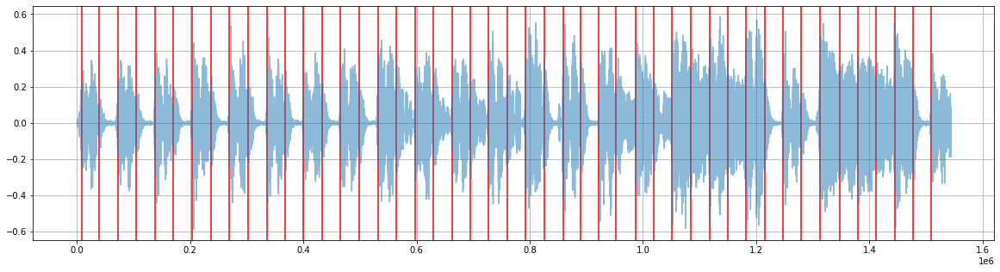

In [18]:
plt.figure(figsize=(20, 5))

for x in librosa.frames_to_samples(beat_frames):
    plt.axvline(x=x, color='red', linewidth=1.5)
    
plt.plot(wavedata_librosa, alpha=0.5)
plt.grid(True)
plt.show()

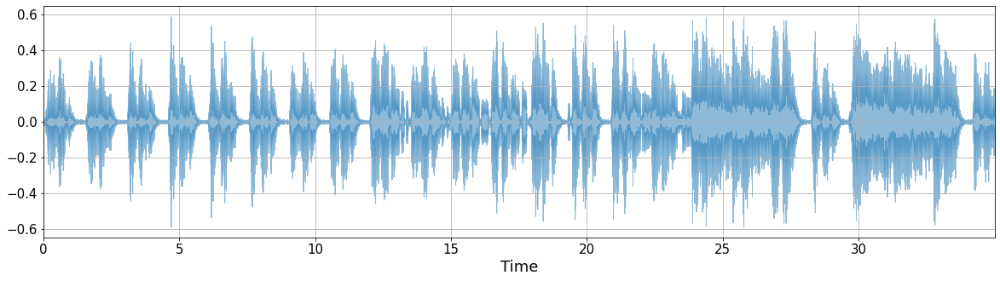

In [19]:
import librosa.display

plt.figure(figsize=(20, 5))
librosa.display.waveplot(wavedata_librosa, sr=samplerate, alpha=0.5)

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.xlabel('Time', fontsize=18)

plt.grid(True) 
plt.show()

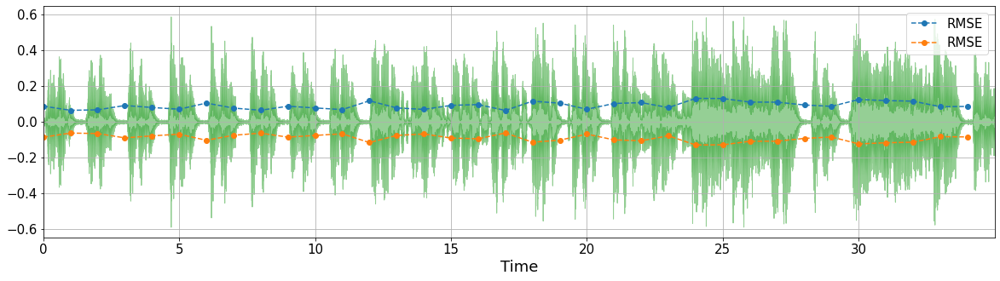

In [20]:
def energy(x):
    return np.sum((x ** 2))

frames = librosa.util.frame(wavedata_librosa, frame_length=samplerate, hop_length=samplerate, axis=0)
rmse = librosa.feature.rms(wavedata_librosa, frame_length=samplerate, hop_length=samplerate, center=False)

plt.figure(figsize=(20, 5))
# plt.plot([energy(frame) for frame in frames], '--o', label='energy')

plt.plot(rmse[0], '--o', label='RMSE')
plt.plot(-rmse[0], '--o', label='RMSE')

librosa.display.waveplot(wavedata_librosa, sr=samplerate, alpha=0.5)

plt.grid(True)
plt.legend(prop={'size':15})

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
    
plt.xlabel('Time', fontsize=18)
plt.show()

(10000,)


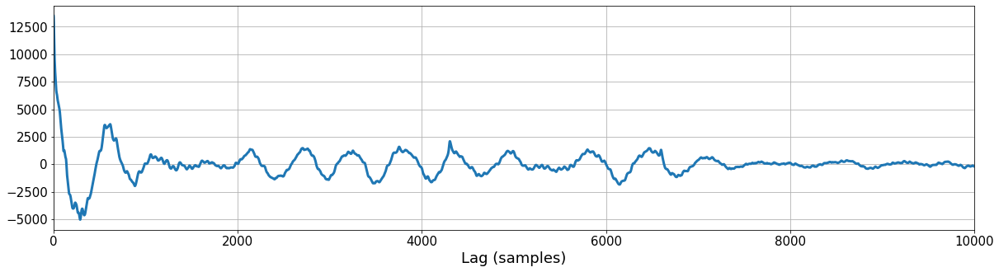

In [21]:
r = librosa.autocorrelate(wavedata_librosa, max_size=10000)
print(r.shape)

plt.figure(figsize=(20, 5))
plt.plot(r, lw=3)
plt.xlim(0, 10000)

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.xlabel('Lag (samples)', fontsize=18)
plt.grid(True)
plt.show()

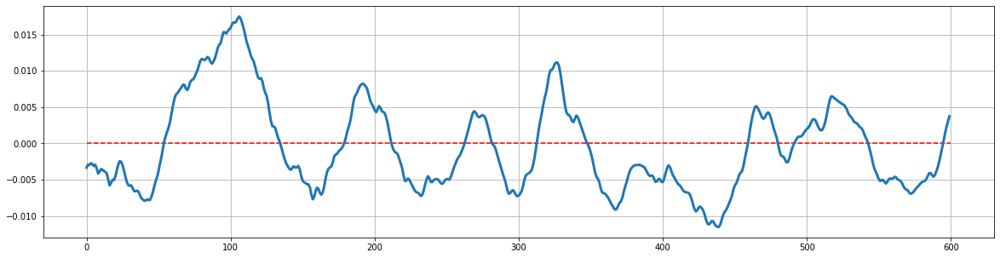

In [22]:
plt.figure(figsize=(20, 5))
plt.plot(wavedata_librosa[1400:2000], lw=3)
plt.hlines(y=0, xmin=0, xmax=600, color='red', ls='--')
plt.grid(True)
plt.show()

In [23]:
zero_crossings = librosa.zero_crossings(wavedata_librosa[1400:2000], pad=False)
zero_crossings.sum()

13

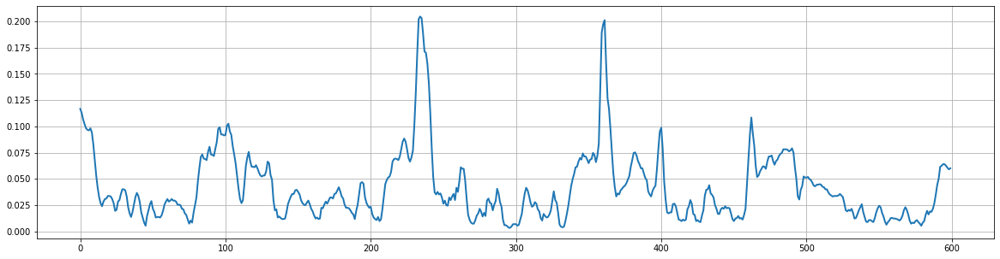

In [24]:
# https://en.wikipedia.org/wiki/Zero-crossing_rate
# скорость перехода через 0
    
plt.figure(figsize=(20, 5))
plt.plot(librosa.feature.zero_crossing_rate(wavedata_librosa)[0][1400:2000], lw=2)
plt.grid(True)
plt.show()

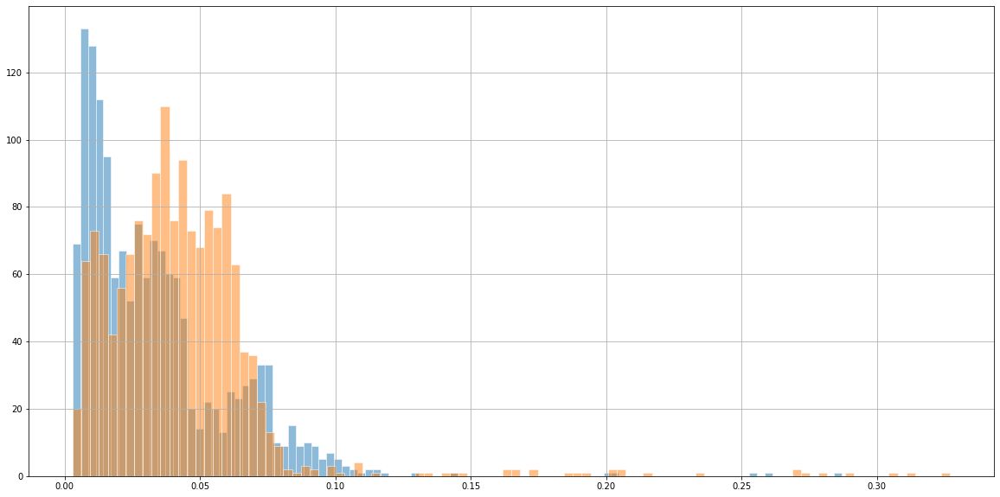

In [25]:
# значимый признак для классификационных задач

zcr1 = librosa.feature.zero_crossing_rate(wavedata_librosa[:771750]) 
zcr2 = librosa.feature.zero_crossing_rate(wavedata_librosa[771750:])

plt.figure(figsize=(20, 10))
plt.hist(zcr1[0], bins=100, alpha=0.5,  edgecolor='white')
plt.hist(zcr2[0], bins=100, alpha=0.5, edgecolor='white')
plt.grid(True)
plt.show()

### Спектральные признаки

<center>
<img src="./pict/spectr.png">
<br />
<br />

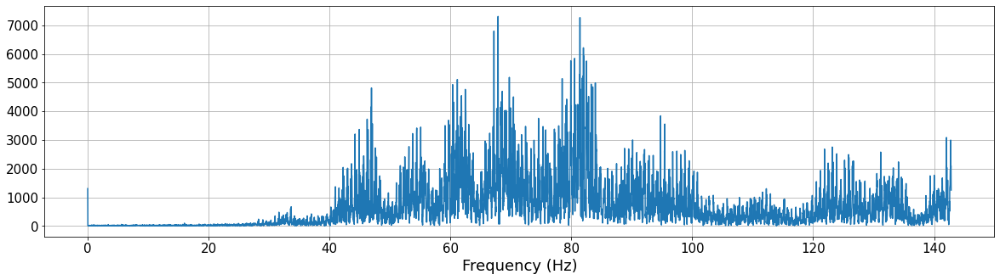

In [26]:
# Фурье спектр

fft = scipy.fft(wavedata_librosa) # считаем спектр
fft_mag = np.absolute(fft) # приводим к абсолютным значениям
f = np.linspace(0, samplerate, len(fft_mag))

plt.figure(figsize=(20, 5))
plt.plot(f[:5000], fft_mag[:5000]) # magnitude spectrum

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.grid(True)
plt.xlabel('Frequency (Hz)', fontsize=18)
plt.show()

In [27]:
# Оконное преобразование Фурье
# https://en.wikipedia.org/wiki/Short-time_Fourier_transform

hop_length = 512
n_fft = 2048
stft = librosa.stft(wavedata_librosa, n_fft=n_fft, hop_length=hop_length)
stft.shape # 3015 - фреймов

(1025, 3015)

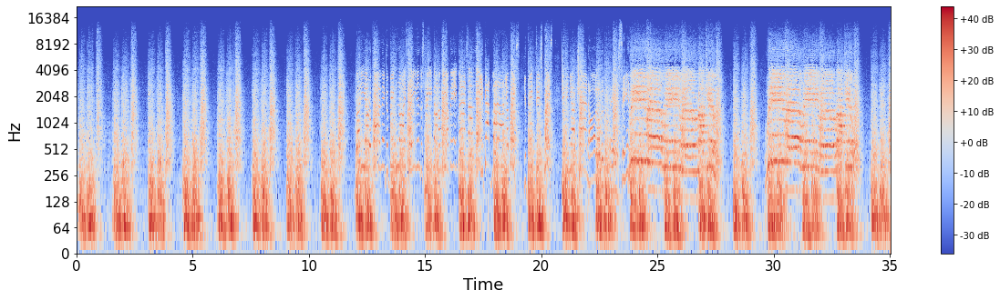

In [29]:
# спектрограмма
S = librosa.amplitude_to_db(np.abs(stft)) # логарифм амлитуды

plt.figure(figsize=(20, 5))
librosa.display.specshow(S, sr=samplerate, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.ylabel('Hz', fontsize=18)
plt.xlabel('Time', fontsize=18)
plt.show()

In [30]:
# Спектральный центроид
# https://en.wikipedia.org/wiki/Spectral_centroid

spectral_centroids = librosa.feature.spectral_centroid(wavedata_librosa, sr=samplerate)[0]
spectral_centroids.shape

(3015,)

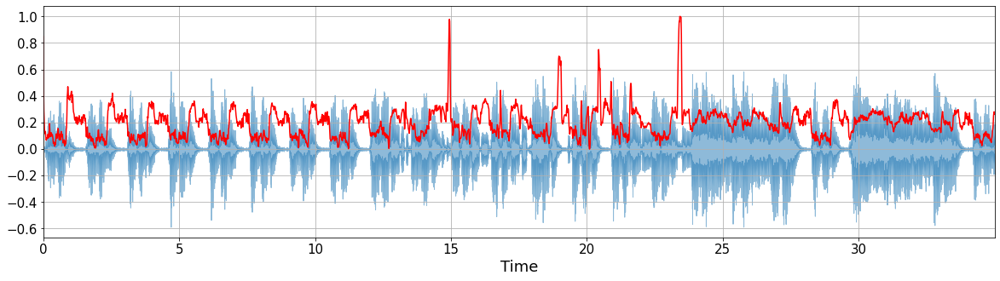

In [31]:
import sklearn

frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames, sr=samplerate)

def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

plt.figure(figsize=(20, 5))
librosa.display.waveplot(wavedata_librosa, sr=samplerate, alpha=0.5)
plt.plot(t, normalize(spectral_centroids), color='r')
plt.grid(True)

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
    
plt.xlabel('Time', fontsize=18)
plt.show()

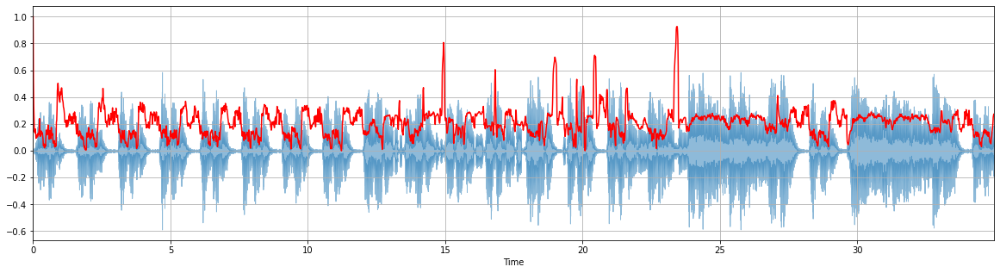

In [32]:
# Спектральный спад

spectral_rolloff = librosa.feature.spectral_rolloff(wavedata_librosa, sr=sr)[0]

plt.figure(figsize=(20, 5))
librosa.display.waveplot(wavedata_librosa, sr=samplerate, alpha=0.5)
plt.plot(t, normalize(spectral_rolloff), color='r')
plt.grid(True)
plt.show()

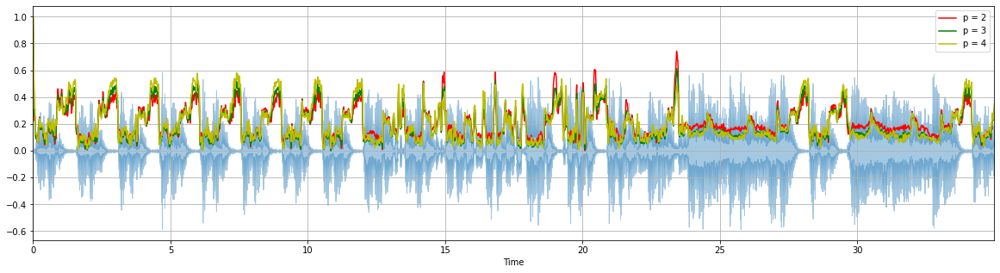

In [33]:
# Спектральная ширина

spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(wavedata_librosa, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(wavedata_librosa, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(wavedata_librosa, sr=sr, p=4)[0]

plt.figure(figsize=(20, 5))
librosa.display.waveplot(wavedata_librosa, sr=samplerate, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))
plt.grid(True)
plt.show()

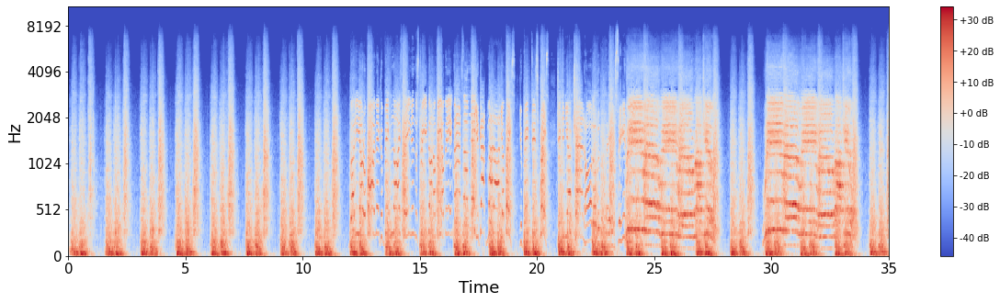

In [35]:
# Mel-spectrogram
# https://en.wikipedia.org/wiki/Mel-frequency_cepstrum

hop_length = 256
S = librosa.feature.melspectrogram(wavedata_librosa, sr=samplerate, n_fft=4096, hop_length=hop_length)
logS = librosa.power_to_db(abs(S))

plt.figure(figsize=(20, 5))
librosa.display.specshow(logS, sr=samplerate, hop_length=hop_length, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.ylabel('Hz', fontsize=18)
plt.xlabel('Time', fontsize=18)
plt.show()

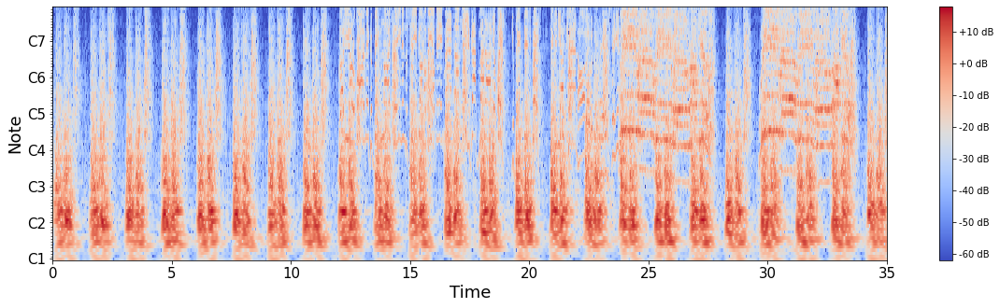

In [37]:
# https://en.wikipedia.org/wiki/Constant-Q_transform

C = librosa.cqt(wavedata_librosa, sr=samplerate)
logC = librosa.amplitude_to_db(abs(C))

plt.figure(figsize=(20, 5))
librosa.display.specshow(logC, sr=samplerate, x_axis='time', y_axis='cqt_note', cmap='coolwarm')
plt.colorbar(format='%+2.0f dB')

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.ylabel('Note', fontsize=18)
plt.xlabel('Time', fontsize=18)

plt.show()

In [38]:
ipd.Audio(wavedata_librosa[:441000], rate=samplerate) # 10 секунд

In [39]:
# onset detection

onset_frames = librosa.onset.onset_detect(wavedata_librosa[:441000], sr=samplerate)
onset_frames

array([  4,   9,  15,  42,  48,  59,  75,  78,  94, 136, 141, 170, 175,
       186, 203, 210, 268, 272, 300, 303, 331, 336, 376, 384, 397, 404,
       432, 460, 463, 513, 524, 528, 537, 544, 558, 561, 564, 586, 591,
       654, 667, 685, 689, 701, 718, 721, 774, 781, 813, 824, 843, 849])

In [40]:
onset_times = librosa.frames_to_time(onset_frames, sr=samplerate)
onset_times

array([0.04643991, 0.1044898 , 0.17414966, 0.48761905, 0.55727891,
       0.68498866, 0.8707483 , 0.90557823, 1.09133787, 1.57895692,
       1.6370068 , 1.97369615, 2.03174603, 2.15945578, 2.3568254 ,
       2.43809524, 3.11147392, 3.15791383, 3.4829932 , 3.51782313,
       3.84290249, 3.90095238, 4.36535147, 4.45823129, 4.609161  ,
       4.69043084, 5.0155102 , 5.34058957, 5.3754195 , 5.95591837,
       6.08362812, 6.13006803, 6.23455782, 6.31582766, 6.47836735,
       6.51319728, 6.54802721, 6.80344671, 6.8614966 , 7.59292517,
       7.74385488, 7.95283447, 7.99927438, 8.1385941 , 8.33596372,
       8.37079365, 8.98612245, 9.06739229, 9.43891156, 9.56662132,
       9.78721088, 9.85687075])

In [41]:
onset_samples = librosa.frames_to_samples(onset_frames)
onset_samples

array([  2048,   4608,   7680,  21504,  24576,  30208,  38400,  39936,
        48128,  69632,  72192,  87040,  89600,  95232, 103936, 107520,
       137216, 139264, 153600, 155136, 169472, 172032, 192512, 196608,
       203264, 206848, 221184, 235520, 237056, 262656, 268288, 270336,
       274944, 278528, 285696, 287232, 288768, 300032, 302592, 334848,
       341504, 350720, 352768, 358912, 367616, 369152, 396288, 399872,
       416256, 421888, 431616, 434688])

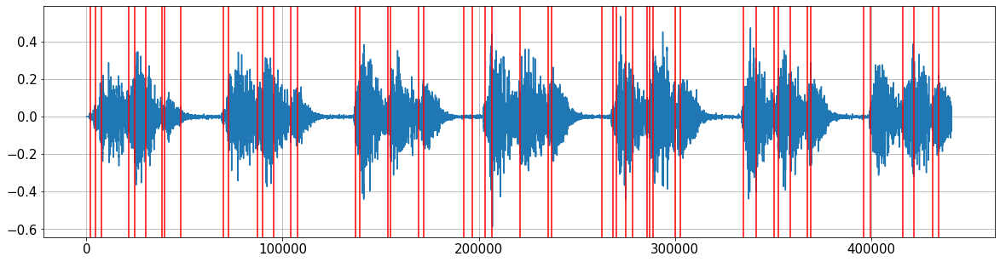

In [42]:
plt.figure(figsize=(20, 5))
plt.plot(wavedata_librosa[:441000])

for x in onset_samples:
    plt.axvline(x=x, color='red', linewidth=1.5)
    
ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.grid(True)
plt.show()

In [ ]:
# https://github.com/stevetjoa/musicinformationretrieval.com - больше примеров